In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()
import statsmodels.api as sm

In [25]:
housing = pd.read_csv('data/housing_cleaned.csv')
#housing['ocean_proximity'] = housing['ocean_proximity'].replace({'INLAND':0,'<1H OCEAN':1,'NEAR OCEAN':2,'NEAR BAY':3,'ISLAND':4})

In [3]:
housing.corr().style.background_gradient()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
longitude,1.000000,-0.924067,-0.101675,0.043082,0.068068,0.101024,0.055211,-0.009994,-0.048456
latitude,-0.924067,1.000000,0.005552,-0.032324,-0.066907,-0.113458,-0.072423,-0.079157,-0.147730
housing_median_age,-0.101675,0.005552,1.000000,-0.372008,-0.328428,-0.296626,-0.310565,-0.192401,0.074041
total_rooms,0.043082,-0.032324,-0.372008,1.000000,0.933807,0.860701,0.921491,0.233230,0.143528
total_bedrooms,0.068068,-0.066907,-0.328428,0.933807,1.000000,0.880459,0.979434,0.029557,0.078329
population,0.101024,-0.113458,-0.296626,0.860701,0.880459,1.000000,0.909878,0.048883,0.013864
households,0.055211,-0.072423,-0.310565,0.921491,0.979434,0.909878,1.000000,0.054966,0.097687
median_income,-0.009994,-0.079157,-0.192401,0.233230,0.029557,0.048883,0.054966,1.000000,0.641985
median_house_value,-0.048456,-0.147730,0.074041,0.143528,0.078329,0.013864,0.097687,0.641985,1.000000


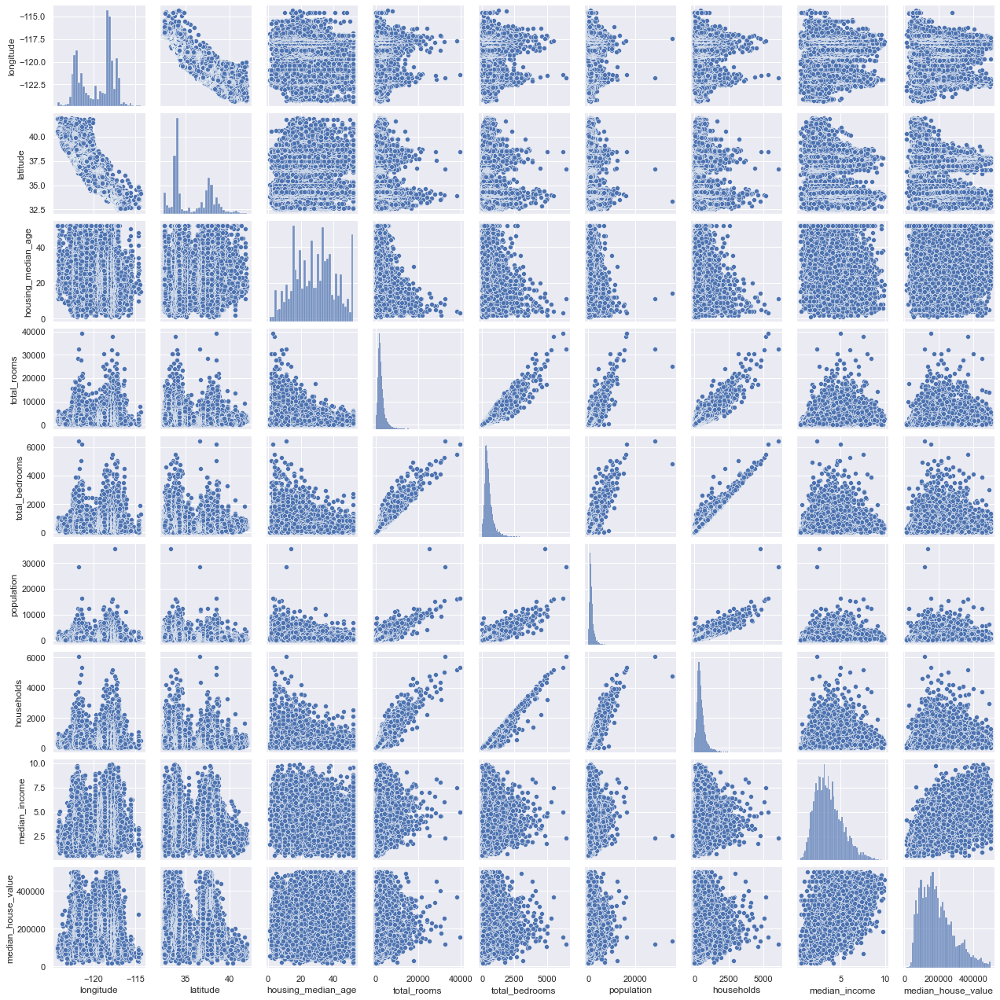

In [5]:
sns.pairplot(housing, height = 2, dropna=True)
plt.show()

## We see almost no correlation between all the features and median_house_value except for median_income

In [4]:
housing_new = housing.copy()
housing_new['person/room'] = housing_new['population']/housing_new['total_rooms']
housing_new['person/bedroom'] = housing_new['population']/housing_new['total_bedrooms']
housing_new['person/household'] = housing_new['population']/housing_new['total_rooms']

housing_new['room/person'] = housing_new['total_rooms']/housing_new['population']
housing_new['bedroom/person'] = housing_new['total_bedrooms']/housing_new['population']
housing_new['household/person'] = housing_new['total_rooms']/housing_new['population']

#housing_new = housing_new.drop(['population', 'households', total_rooms','total_bedrooms','total_rooms'], axis=1)

In [5]:
housing_new.corr().style.background_gradient()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,person/room,person/bedroom,person/household,room/person,bedroom/person,household/person
longitude,1.000000,-0.924067,-0.101675,0.043082,0.068068,0.101024,0.055211,-0.009994,-0.048456,0.039640,0.020592,0.039640,-0.080583,-0.049724,-0.080583
latitude,-0.924067,1.000000,0.005552,-0.032324,-0.066907,-0.113458,-0.072423,-0.079157,-0.147730,-0.041483,-0.018893,-0.041483,0.157529,0.115413,0.157529
housing_median_age,-0.101675,0.005552,1.000000,-0.372008,-0.328428,-0.296626,-0.310565,-0.192401,0.074041,0.049046,0.019514,0.049046,-0.131694,-0.069883,-0.131694
total_rooms,0.043082,-0.032324,-0.372008,1.000000,0.933807,0.860701,0.921491,0.233230,0.143528,-0.073867,-0.039417,-0.073867,0.134220,0.055091,0.134220
total_bedrooms,0.068068,-0.066907,-0.328428,0.933807,1.000000,0.880459,0.979434,0.029557,0.078329,-0.043177,-0.049023,-0.043177,0.065662,0.098489,0.065662
population,0.101024,-0.113458,-0.296626,0.860701,0.880459,1.000000,0.909878,0.048883,0.013864,0.077598,0.073422,0.077598,-0.137502,-0.134964,-0.137502
households,0.055211,-0.072423,-0.310565,0.921491,0.979434,0.909878,1.000000,0.054966,0.097687,-0.034571,-0.038454,-0.034571,-0.023421,0.002923,-0.023421
median_income,-0.009994,-0.079157,-0.192401,0.233230,0.029557,0.048883,0.054966,1.000000,0.641985,-0.092312,0.012933,-0.092312,0.213659,-0.063461,0.213659
median_house_value,-0.048456,-0.147730,0.074041,0.143528,0.078329,0.013864,0.097687,0.641985,1.000000,-0.075372,-0.032056,-0.075372,0.159939,0.050627,0.159939
person/room,0.039640,-0.041483,0.049046,-0.073867,-0.043177,0.077598,-0.034571,-0.092312,-0.075372,1.000000,0.966728,1.000000,-0.169246,-0.124645,-0.169246


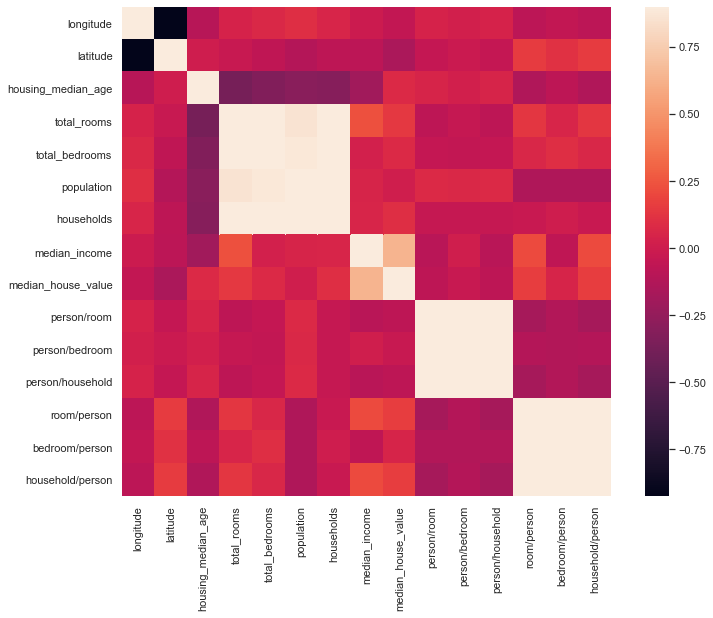

In [6]:
plt.subplots(figsize=(12,9))
sns.heatmap(housing_new.corr(), vmax=0.9, square=True, annot=False)
plt.show()

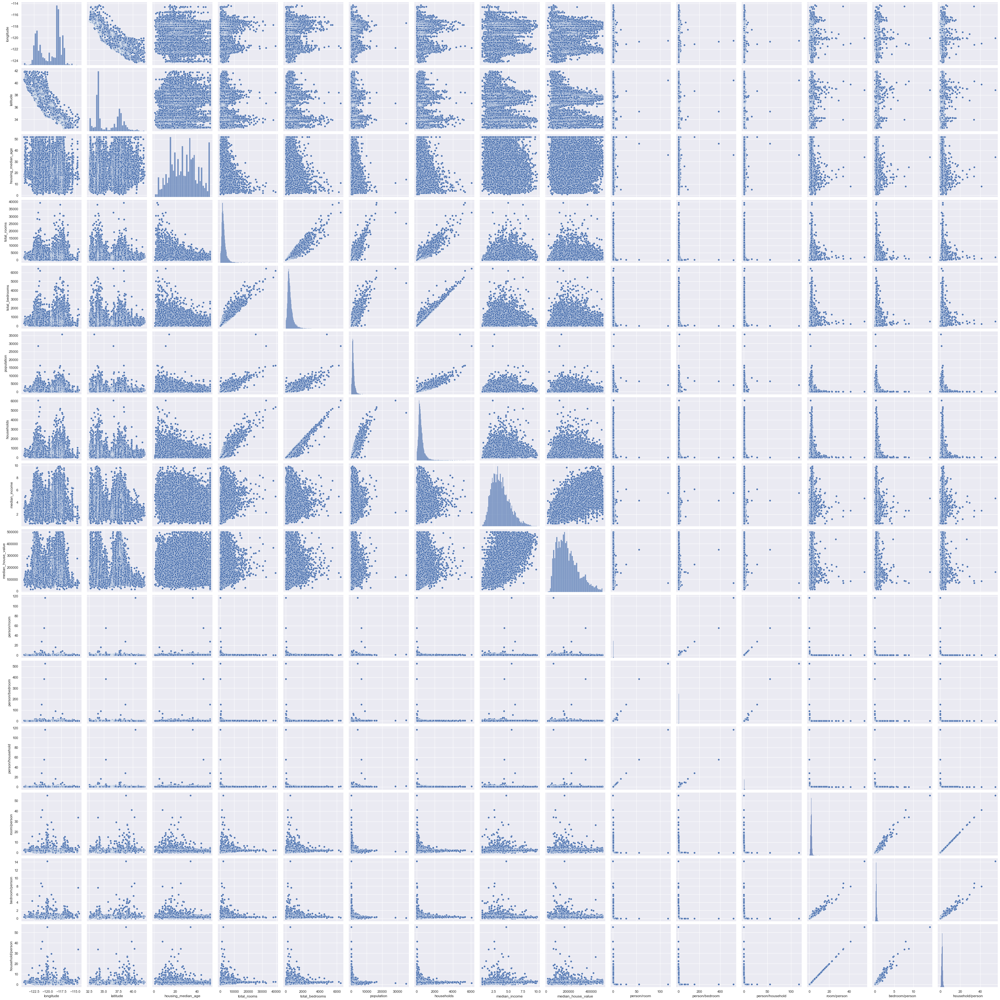

In [7]:
# This plot was saved as an image file and analysed with an image viewer app
sns.pairplot(housing_new, height = 3, dropna=True)
plt.show()

In [ ]:
"""
transformations to apply to y and x:
log()
sqrt()
square()

def transform(series, lmd):
       return lmd(series)
"""

In [26]:
# less cluttered dataframe for pairplot
housing_sometemp = housing.copy()

In [28]:
for lbd in [['log_',lambda x:np.log(x)], ['sqrt_',lambda x:np.sqrt(x)], ['sqr_',lambda x:np.square(x)]]:
    for feature in ['median_house_value', 'population', 'households', 'total_rooms','total_bedrooms','total_rooms']:
        housing_new[lbd[0]+feature] = housing_new[feature].apply(lbd[1])
        housing_sometemp[lbd[0]+feature] = housing_sometemp[feature].apply(lbd[1])

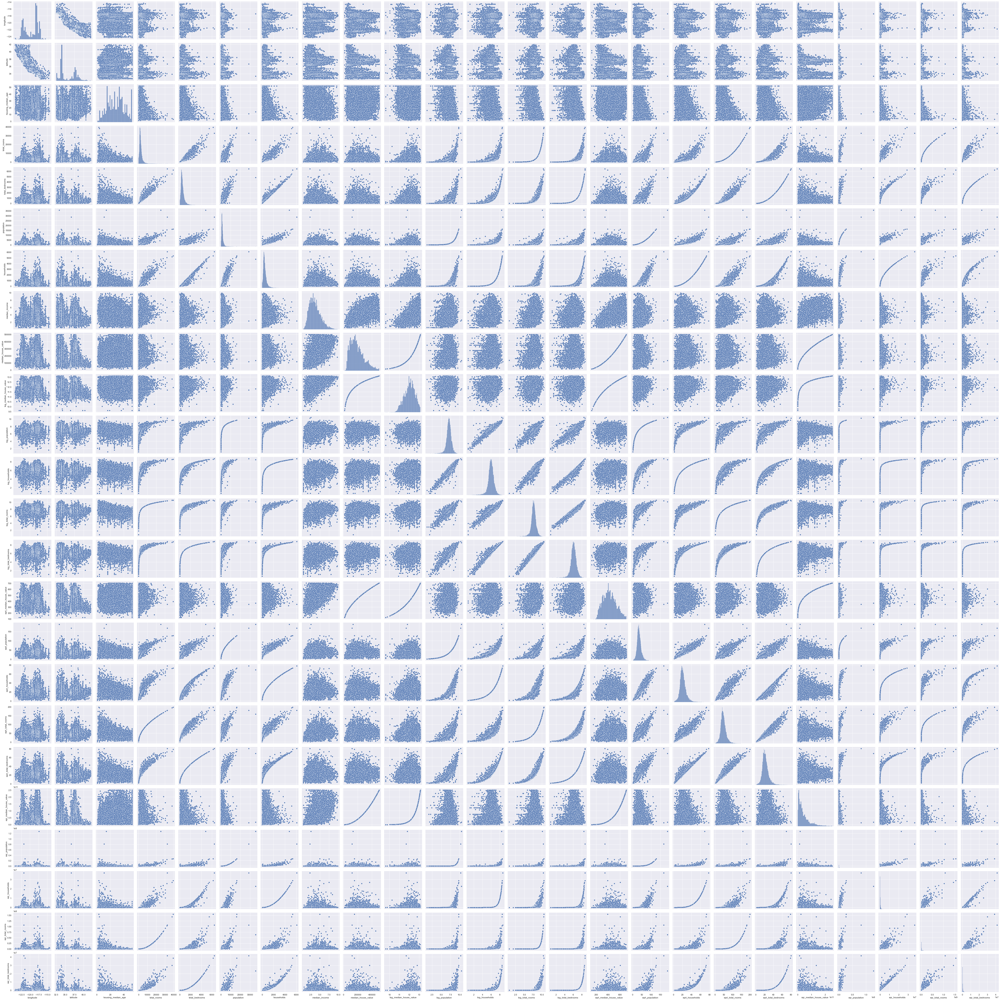

In [29]:
# This plot was saved as an image file and analysed with an image viewer app
sns.pairplot(housing_sometemp, height = 3, dropna=True)
plt.show()

In [30]:
for lbd in [['log_',lambda x:np.log(x)], ['sqrt_',lambda x:np.sqrt(x)], ['sqr_',lambda x:np.square(x)]]:
    for feature in ['person/room','person/bedroom','person/household','room/person','bedroom/person','household/person','median_income']:
        housing_new[lbd[0]+feature] = housing_new[feature].apply(lbd[1])

In [31]:
hc = list(housing_new.columns)
mhv = ['median_house_value','log_median_house_value','sqrt_median_house_value','sqr_median_house_value']
for i in mhv:
    hc.remove(i)
hc = mhv + hc
housing_new = housing_new[hc]

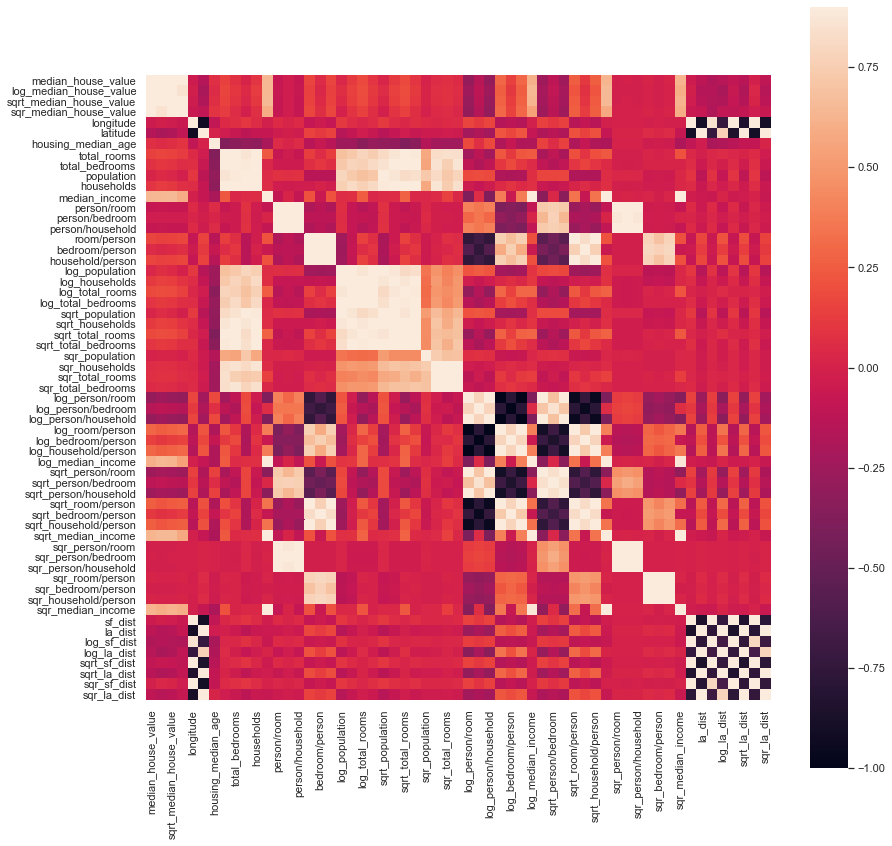

In [33]:
plt.subplots(figsize=(14,14))
sns.heatmap(housing_new.corr(), vmax=0.9, square=True, annot=False)
plt.show()

In [34]:
housing_new.dropna().corr().style.background_gradient()

# Geographical features
## Based on the map in part I, it is distance from the city centres are somewhat correlated to the value of a housing block, but not linearly.

In [16]:
# latitude then longitude
# San Francisco: 37.7749° N, -122.4194° W
# Los Angeles 34.0522° N, -118.2437° W

"""
Lambda and function transformation for multiple columns with round. Not necessary

sf = (37.7749,-122.4194)
la = (34.0522,-188.2437)

def coord_dist(df, city):
    ecd = np.sqrt((df.latitude-37.7749)**2 + (df.longitude+122.4149)**2)
    return np.round(ecd, 4)

housing['sf_dist'] = housing.apply(lambda x :coord_dist(x[['latitude','longitude']], sf), axis=1)
"""

housing_new['sf_dist'] = np.round(np.sqrt((housing['latitude']-37.7749)**2 + (housing['longitude']+122.4149)**2), 4)
housing_new['la_dist'] = np.round(np.sqrt((housing['latitude']-34.0522)**2 + (housing['longitude']+118.2437)**2), 4)

In [17]:
"""
def transform(series, lmd):
       return lmd(series)
       
housing['log_sf_dist'] = transform(housing['sf_dist'], lambda x: np.round(np.log(x), 4)
"""
def transform(series, lmd):
       return lmd(series)
    
for lbd in [['log_',lambda x:np.log(x)], ['sqrt_',lambda x:np.sqrt(x)], ['sqr_',lambda x:np.square(x)]]:

    # Lambda at the end is a combination of the loop's lambda and np.round(4)
    housing_new[lbd[0]+'sf_dist'] = transform(housing_new['sf_dist'], lambda x: np.round(lbd[1](x),4))
    housing_new[lbd[0]+'la_dist'] = transform(housing_new['la_dist'], lambda x: np.round(lbd[1](x),4))

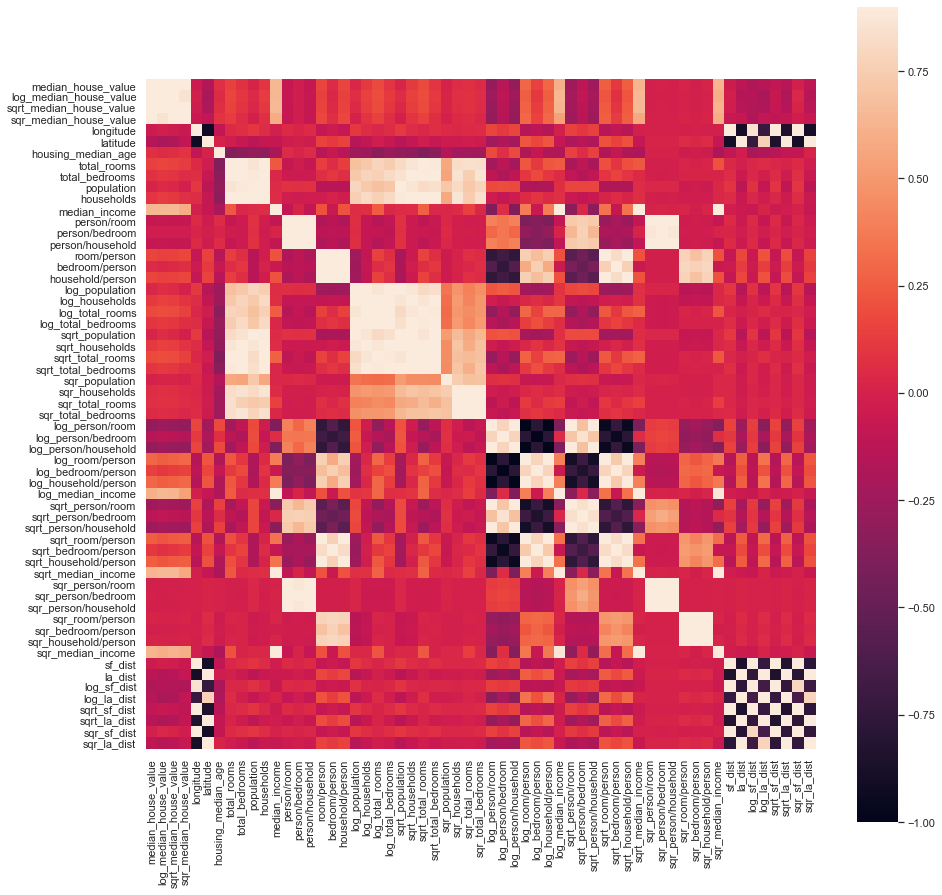

In [18]:
plt.subplots(figsize=(15,15))
sns.heatmap(housing_new.corr(), vmax=0.9, square=True, annot=False)
plt.show()

In [19]:
housing_new.corr().style.background_gradient()

# Encoding ocean_proximity

In [47]:
housing_new_final = pd.get_dummies(housing_new)
housing_new_final = housing_new_final.drop('ocean_proximity_ISLAND', axis=1)
housing_new_final.columns

Index(['median_house_value', 'log_median_house_value',
       'sqrt_median_house_value', 'sqr_median_house_value', 'longitude',
       'latitude', 'housing_median_age', 'total_rooms', 'total_bedrooms',
       'population', 'households', 'median_income', 'person/room',
       'person/bedroom', 'person/household', 'room/person', 'bedroom/person',
       'household/person', 'log_population', 'log_households',
       'log_total_rooms', 'log_total_bedrooms', 'sqrt_population',
       'sqrt_households', 'sqrt_total_rooms', 'sqrt_total_bedrooms',
       'sqr_population', 'sqr_households', 'sqr_total_rooms',
       'sqr_total_bedrooms', 'log_person/room', 'log_person/bedroom',
       'log_person/household', 'log_room/person', 'log_bedroom/person',
       'log_household/person', 'log_median_income', 'sqrt_person/room',
       'sqrt_person/bedroom', 'sqrt_person/household', 'sqrt_room/person',
       'sqrt_bedroom/person', 'sqrt_household/person', 'sqrt_median_income',
       'sqr_person/room', 

In [49]:
housing_new_final.to_csv('data/housing_processed.csv', index=False)